In [117]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.linalg as linalg
import scipy.sparse as sp
import scipy.sparse.linalg as spla
import math
from numpy.random import rand

問題1 ~ 9 では $u^{''} + du^{'} +4u = 1$をゼロ初期条件のもとで周波数領域でとく

## 2.5.1
（減衰なし）$u^{''} + 4u^{'} = 1$を$s^{2}U(s)  + 4U(s) = 1/s$と変換し,$U(s)$について解け.$U(s)$を例3のように２個の分数の和に書け.変換表から$u(t)$を決めよ.

### 解答

$U(s) = \frac{1}{s(s^{2} + 4)} =\frac{1}{4}( \frac{1}{s}  - \frac{s}{s ^ {2} + 4})$

これをラプラス逆変換すると

$u(t) = \frac{1}{4}(1 - cos2\omega t)$

## 2.5.2
（臨界減衰）$u^{''} + 4u^{'} +4u= 1$を$(s^{2} + 4s + 4)U(s)  = 1/s$と変換し,この問題の伝達関数$G(s)$を決めよ.強制項からくる$1/s$は,$G(s)$には含まれないことに注意せよ.$s^{2} + 4s + 4 $は$s = -2$に二重根を持つから,伝達関数は二重の______を持つ.　$U(s)$を例４のように,３個の分数の和にかけ.
### 解答

$u^{''} + 4u^{'} + 4u = 1 → U(s) = \frac{1}{s(s + 2) ^ {2}} =\frac{1}{8}( \frac{2}{s} - \frac{1}{s + 2} - \frac{1}{s + 2})$

伝達関数は二重の極を持つ

## 2.5.3
問題2を続け,これら３個の分数に対する逆変換を決めて,$u(t)$を求めよ.異なる項$1/(s+2)^{2}$は,$s=-2$を二重根とする$u^{''} + 4u^{'} + 4u = 0$の第二解,$te^{-2t}$の変換である.$te^{-2t}$を直接方程式に代入し,この解を確認せよ
### 解答

$U(s) = \frac{1}{8}( \frac{2}{s} - \frac{1}{s + 2} - \frac{1}{s + 2})$

これをラプラス逆変換すると

$u(t) = \frac{1}{4}(1 - e ^ {-2t})$

## 2.5.4
（過大減衰）$u^{''} + 5u^{'} + 4u = 1$を$(s^{2} + 5s + 4)U(s) = 1/s$と変換せよ. この２次式を因数分解し,伝達関数の2個の極を求めよ.$U(s)$を$1/s$と$A/(s + 1)$と$B/(s + 4)$の和に表し,$u(t)$を求めよ.
### 解答

$u^{''} + 5u^{'} + 4u = 1 → U(s) = \frac{1}{s(s + 1) (s + 4)} =\frac{1}{12}( \frac{3}{s} - \frac{4}{s + 1} + \frac{1}{s + 4})$ 

この式から極は$s = -1, -4$ である

またラプラス逆変換して

$u(t) = \frac{1}{12}(3 - 4e^{-t} + e ^ {-4t})$

## 2.5.5
減衰係数$d = 5$をその臨界値$d = 4$へ減少させる時,$s^{2} +ds +4$の２個の零点はどのようにして,$s = -2$における二重零点に動いてゆくか？

(a)各零点を$d$の関数として,d=5:-0.1:4あるいはd=5:-0.01:4に対してプロットせよ.

(b)$s^{2} + (4 + \epsilon)s + 4 = 0$を解き,$\epsilon → 0$のとき,その根における首項を求めよ.
### 解答

(a)
$s ^ {2} + ds + 4 $の極は　$s = \frac{-d \pm \sqrt{d^{2} - 16}}{2}$

dの遷移が 5 → 4の時、sは常に実数

零点の位置をプロットすると

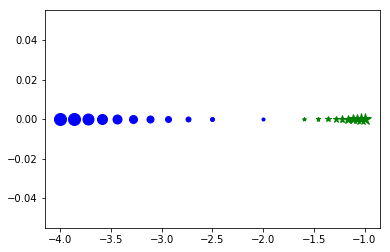

In [118]:
%matplotlib inline

plt.plot(-1, 0, "g*" ,-4, 0, "bo",markersize=12  )
d = 5
step = -0.1
a = (5 - 4) / abs(step)

for  k in range(int(a)):
    d += step
    sp = (- d + np.sqrt(d * d - 16)) / 2
    sm = (- d - np.sqrt(d * d - 16))/ 2
    plt.plot(sp , 0 , "g*" , sm , 0 ,"bo", markersize=12  -  k  / int(a) * 10)

(b)
$s^{2} + (4 + \epsilon)s + 4 = 0$ の時,　$s = \frac{-(4 + \epsilon) \pm \sqrt{(4 + \epsilon)^{2} - 16}}{2} = \frac{-(4 + \epsilon) \pm \sqrt{\epsilon (\epsilon + 8)}}{2}$ 

首項ってなんだ…

## 2.5.6
（不足減衰）$u^{''} + 2u^{'} + 4u = 1$を$(s^{2} + 2s + 4)U(s) = 1/s$に変換せよ.この２次方程式の複素共役根を求めよ.解における因子$e^{-at}$の減衰率$\alpha$どうなるか？この解における振動因子$cos\omega t$と$sin\omega t$の周波数$\omega$はどうなるか？
### 解答

$s^{2} + 2s + 4　＝0$ をとくと, $s = -1 \pm i\sqrt{3}$　これが複素共役根である.
ここで $U(s) = \frac{A}{s} + \frac{B}{s + 1 + i\sqrt{3}} + \frac{C}{s + 1 - i\sqrt{3}}$ (A,B,Cは定数)と表すことができる

これをラプラス逆変換する際に$e^{-at}$の項が発生するが、ラプラス逆変換表より
$u(t) = A + Be^{(-1-i\sqrt{3})t} + Ce^{(-1-i\sqrt{3})t}$となる

ここでオイラーの公式を適用することで

$u(t) = A + Be^{(-1-i\sqrt{3})t} + Ce^{(-1-i\sqrt{3}t)t} = A + e ^ {-t}(B^{'}cos\sqrt{3}t + C^{'}sin\sqrt{3}t)$     ($B^{'},C^{'}$は定数) 

と書き直すことができるのでこれより $a = -1$ , $\omega = \sqrt{3}$とわかる

## 2.5.7
問題6の続きとして,$U(s) = 1/s(s^{2} + 2s + 4)$を$1/s$と$(As + B)/(s^{2} + 2s + 4)$の和として書け.得られた変換式の逆を作るため
$\frac{As + B}{s^{2} + 2s + 4} = \frac{A(s + 1)}{(s + 1)^{2} + 3} + \frac{B - A}{(s + 1)^{2} + 3} = \frac{As }{s^{2} + 3} + \frac{B - A}{s^{2} + 3}$へ変数シフト
と書け.このシフトによって$u(t)$に$e^{-at}$の因子が生じる.シフトされた項を逆変換し,振動因子$Acos\omega t$と$Csin\omega t$を求めよ.
### 解答

$U^{'}(s) = \frac{As }{s^{2} + 3} + \frac{B - A}{s^{2} + 3}$をラプラス逆変換すると
$u(t) = Acos\sqrt{3}t + \frac{B-A}{\sqrt{3}}sin\sqrt{3}t$

## 2.5.8
問題6の続きとして,$u(t)$のグラフを描き,$u = 1$より上の最大値$u_{max}$の位置を決めよ.
チャレンジ問題 : d = 2 :0.5 :4 に対して$u(t)$のグラフを一枚にプロットせよ.各$d$に対して$u_{max}$と$t_{max}$を求めよ(臨界値$d = 4$では$u_{max} = 1$と$t_{max} = +\infty$であることに注意)
### 解答

$u(t) = 1 + シフトされたu^{'}$

ここでs+1 → sとシフトしていることから
$u(t) = 1 + e^{-t}(Acos\sqrt{3}t + \frac{B-A}{\sqrt{3}}sin\sqrt{3}t)$

これは2.5.6で立てた解の予測と一致している

Umax = 38.566107752785186


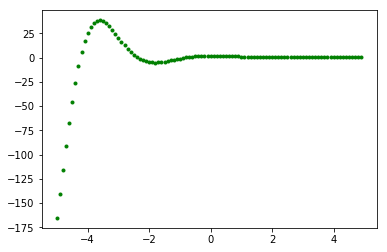

In [159]:
%matplotlib inline
ax=plt.subplot()
#ax.set_ylim([-3,3])

t = -5
step = 0.1
A = 1 
B = 2
Umax = 1 

a = 1/abs(step) * 10
for  k in range(int(a)):
    u = 1 + math.exp(-t) * (A * math.cos(math.sqrt(3) * t) + (B-A) / math.sqrt(3) * math.sin(math.sqrt(3) * t))
    if Umax < u:
        Umax = u
    plt.plot(t , u , "go" , markersize=3 )
    t += step 
    
print("Umax =" ,Umax )


Umax = 19.613944568515937 2
Umax = 0.25023821219756803 2.5
Umax = 0.2500000000103181 3.0
Umax = 0.25 3.5


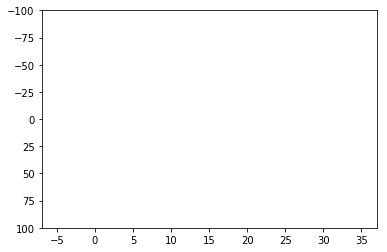

In [158]:
%matplotlib inline
ax=plt.subplot()
ax.set_ylim([100,-100])

d = 2
step = 0.5
a = (4 - 2) / abs(step) 
t = -5



for  i in range(int(a)):
    Umax = 0
    
    for j in range(1000) :
        u = 1/8 * (2 - math.exp(-1/2 * d * t) *(2 * math.cos(1/2 * math.sqrt(16 - d **2 ) * t) - 2 / math.sqrt(16 - d **2) * math.sin(1/2 * math.sqrt(16 - d **2 ) * t)))
        plt.plot(t , u, color = [0.1 + i * 0.1,0.1 + i * 0.1,0.1 + i * 0.1 ], markersize=1)
        if Umax < u:
            Umax = u
        t +=  0.01
    
    print("Umax =" ,Umax , d )
    d += step
     

## 2.5.9
負の減衰$d = -5$のとき,$u^{''} - 5u^{'} + 4u = 1$を変換し,$U(s)$を$1/s + A/(s - 1) + B / (s - 4)$とかき,その逆変換を行って,$u(t)$を求めよ. $d = +5$としたための問題4からの変化は,$t → \infty$のとき今度は解が_____となることである
### 解答

$U(s) = \frac{1}{4}(\frac{2}{s} - \frac{3}{s - 1} + \frac{1}{s - 4})$　と分解することができるので,これを逆ラプラス変換すると

$u(t) = \frac{1}{4}(2 - 3e^{-t} + e^{-4t})$

ここで$t → \infty$とすると

$u(\infty) = 1/2$となる　　問題4では$u(\infty) = 1/4$

## 2.5.10
ラプラス変換$U(s)$を求めることによって,強制項のない方程式$u^{''} + 4u = 0$を初期条件$u(0) = u^{'}(0) = 1$ のもとで解け.表を使えば,$u(0)$と$u^{'}$がどのようにして,強制項からは生じない右辺項を生み出すかがわかる.$U(s)$を$A / (s - 2i) + B / (s + 2i)$と書き,$u(t) = Ae^{2it} + Be^{-2it}$となることを確認せよ.
### 解答

$u^{''} + 4u = 0$を初期条件$u(0) = u^{'}(0) = 1$ のもとでラプラス変換すると

$U(s) = \frac{1}{s ^ {2} + 4}$

これを部分分数分解すると
$U(s) = \frac{1}{4}(\frac{1}{s - 2i} + \frac{1}{s + 2i})$

これをラプラス逆変換することで

$u(t) = \frac{1}{4}(e^{2it} - e^{-2it})$     と$u(t)$がもとまる

## 2.5.11
問題10の続きとして,$u(t)$を$cos2t$と$sin2t$の線形結合として書け.表を使って,その変換が問題10の$U(s)$と一致することを確かめよ
### 解答

オイラーの公式を適用することで

$u(t) = \frac{1}{4}(e^{2it} - e^{-2it}) = \frac{1}{2}(sin2t )$

これをラプラス逆変換すると

$U(s) = \frac{1}{s ^ {2} + 4}$

これは問題１０の結果と一致している

## 2.5.12
臨界減衰の方程式$u^{''} + 4u^{'} +4u = 0$は二重根$s = -2$を持つ.$e^{-2t}$と$te^{-2t}$の線形結合$u(t)$で,初期条件$u(0) = 4$と$u^{'}(0) = 8$を満たすものを求めよ.表を使って,この$u(t)$の変換は,$u^{''} + 4u^{'} +4u = 0$から直接わかる変換$U(s)$と一致することを確かめよ.
### 解答

$u(t) = Ae^{-2t} + Bte^{-2t}（A,Bは定数）$　とおく
初期条件$u(0) = 4 u^{'}(0)= 8 $を代入することで

$u(0) = A = 4$

$u^{'}(0) = -2A + B = 8 $

これより$A = 4,   B =16 $

よって$u(t) = 4e^{-2t} + 16te^{-2t}$

またこれをラプラス逆変換する

$U(s)  = \frac{16}{(s + 2) ^ {2}} + \frac{4}{s + 2}$

今度はこれをラプラス変換を用いてとく

$u″+4u′+4u=0 $を初期条件$u(0) = 4, u^{'}(0) = 8$のもとでラプラス変換すると

$U(s) = \frac{4s + 24}{(s + 2) ^ {2}} = \frac{16}{(s + 2) ^ {2}} + \frac{4}{s + 2}$

よって一致することが確認できた

## 2.5.13
図2.20の単独ループで$L = 0$(インダクターなし)とすると,式(10)と(11)の伝達関数が次のように与えられる.

$\frac{I(s)}{V(s)} = \frac{1}{R + \frac{1}{Cs}}$と$\frac{Vc(s)}{V(s)} = \frac{1}{RCs + 1}$

このループにおけるインピーダンスZは何か?　１階方程式$Ru^{'} + u/C = 0$は,いかなる指数関数$u = e ^ {-at}$によって満たされるか? 減少率$s = -a$が伝達関数の極となっていることを確かめよ.
### 解答

## 2.5.14
$R,L$と$C$の正の値に対して,伝達関数$1 / (LCs^{2} + RCs + 1)$の極を求めよ,これらの極の,$L → 0$における極限値は何か?
### 解答

$LCs^{2} + RCs + 1 = 0$ をとくと

$s = \frac{-RC \pm \sqrt{(RC)^{2} - 4LC}}{2LC}$  = \frac{-RC \pm \sqrt{(RC)^{2} - 4LC}}{2LC}

ロピタルの定理を用いて$L → 0$の時の極限値を求めると

$s_{L → 0} = \frac{-RC \pm \sqrt{(RC)^{2} - 4LC}}{2LC} L → 0$  =  $\frac{\pm2}{\sqrt{(RC)^{2}- 4LC}} L → 0$ = $\pm\frac{2}{RC}$

## 2.5.15
RLCループ（直列の）はインピーダンス$Z = Ls + R + (Cs)^{-1}$とアドミッタンス$Y = 1 / Z$を持つ.これら３個の素子が並列につながっているのならば,$Y$と$Z$はどうなるか？（アドミッタンスは並列に加える.）
### 解答

並列接続なので、この回路の合成インピーダンス Zは、各素子のインピーダンスの逆数を足して、それの逆数をとれば 求められる

よって$ Z = 1/Y = \frac{1}{\frac{1}{R} + j\omega L + \frac{1}{ j\omega L}}$ 

## 2.5.16
一列のバネ系が今度は,次に示す一列の$RLC$または一列のばね・質点・ダッシュポット系である.

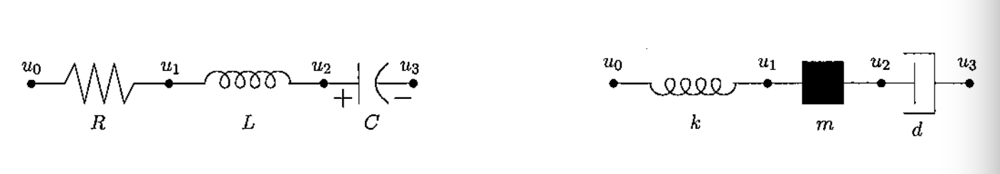

第一方程式は,オームの法則から$e_{1} = u_{1} - u_{0} = RI(t)$と,フックの法則から$e = w(t) / k$である.列の$RLC$において,$e_{2}$と$e_{3}$に対する微分方程式を求めよ.電流$I(t)$は,各ノードで同じである（電流の釣り合い）
### 解答

$e_{2} = u_{2} - u_{1} = L\frac{dI(t)}{dt}$

$e_{3} =u_{3} - u_{2}= \frac{1}{C}\int I(t) dt$

## 2.5.17
$Nise[118]^{2}$ の例3.1は,このネットワークの電流$I_{r}(t)$に対する状態空間方程式（周波数ではなく,間について）を与えている.次の３方程式を説明せよ.

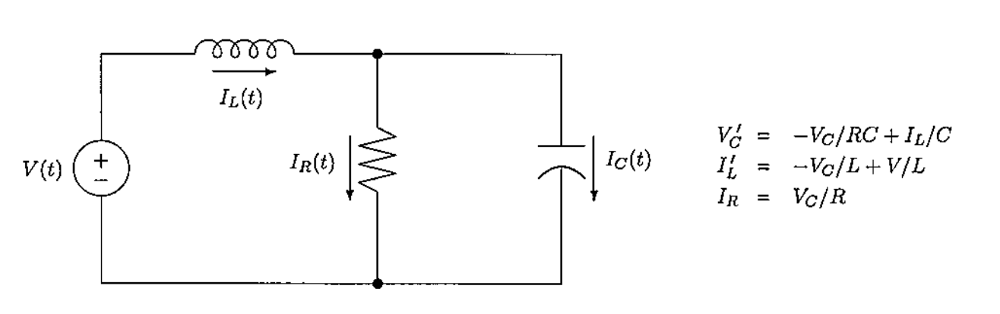
### 解答

$V_{c}^{'}$ $V_{c}$ に対する状態方程式

$I_{L}^{'}$　コイルに加わる電圧とコンデンサーに加わる電圧の合計は電源電圧に等しい、という関係式から求めた式

$I_{R}$ オームの法則により求めた抵抗に流れる電流値（コンデンサーとコイルにかかる電圧値は等しい）

## 2.5.18
(推奨問題)問題17において,状態方程式$x^{'} = Ax + Bu$と出力方程式$y = Cx + Du$の状態変数$x$,入力$u$,出力＄y＄,行列$A,B,C,D$が何に対応するか示せ.
### 解答

$x = V_{C}, u=I_{L}, y = I_{R}$

$A = -\frac{1}{RC} , B = \frac{1}{C} , C = \frac{1}{R} , D = 0$

## 2.5.19
力学では,質点の位置$u(t)$と速度$v(t)$は自然な状態変数である.
ダッシュポット$d$,質点$m_{1},$ばね$k,$質点$m_{2}$,力$f(t)$が一列になり,左端が固定されている状態を図示せよ.下に与えた状態方程式$(Nise[118],p.143)^{3}$を説明せよ

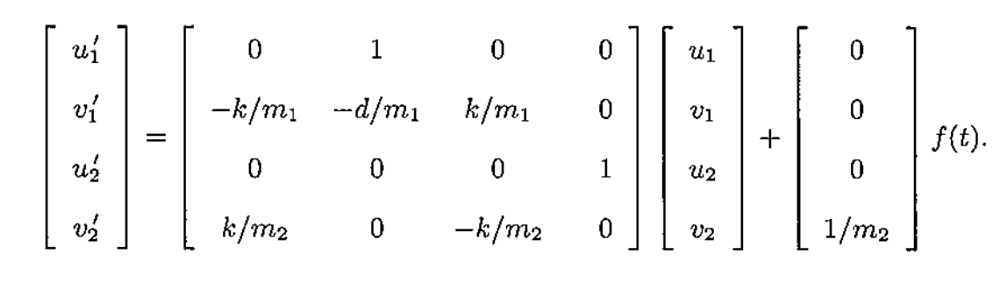

### 解答

[image.png]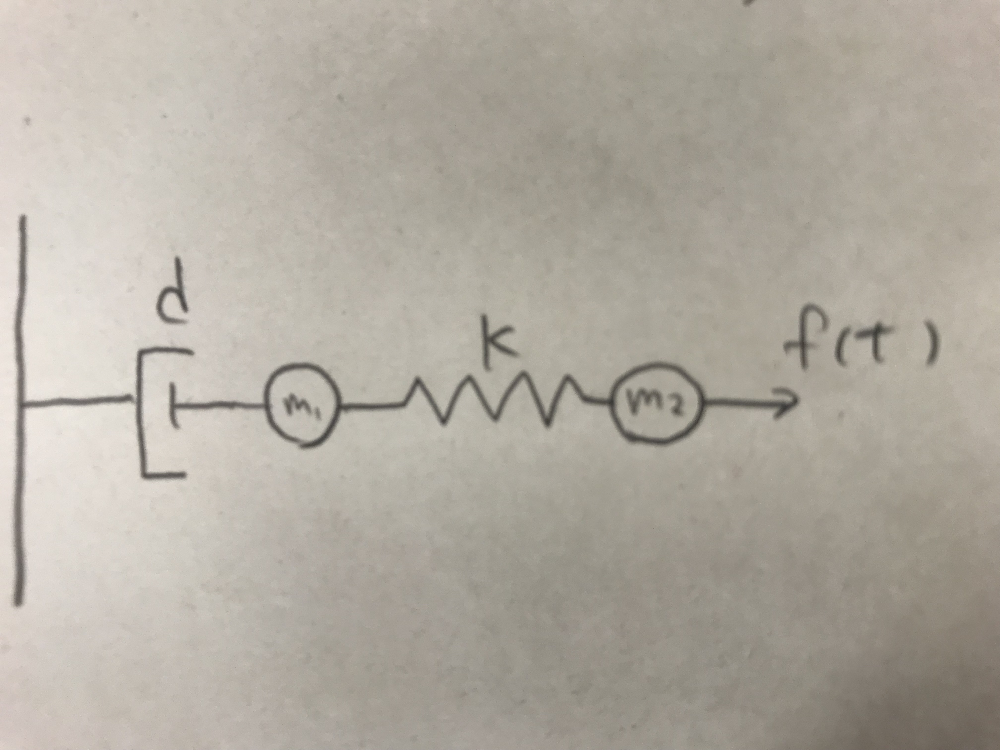(attachment:image.png)
書くのが面倒なので聞かれたらその場で答えます

## 2.5.20
(特に推奨)ゼロ初期条件と定数行列$A,B,C,D$のもとで,状態方程式$x^{'} = Ax + Bu$ と出力方程式$y = Cx +Du$を,$X(s)$と$Y(s)$に対する周波数領域方程式に変換せよ,まず$X(s)$について解き、それを$Y = CX + DU$に代入して,$Y(s) = [伝達行列]U(s)$を求めよ.得られた式は$(sI - A)^{-1}$を含むであろうから,Aの固有値は,伝達行列の行列式である伝達関数$T(s)$の極である.
### 解答

$x^{'} = Ax + Bu$

$y = Cx +Du$をそれぞれラプラス変換すると

$(sI - A)X(s) = BU(s)$ → $X(s) = (sI - A)^{-1}BU(s)$ ・・・①

$Y(s) = CX(s) + DU(s) $・・・②

①,②を合わせて
$Y(s) = (C(sI - A)^{-1}B + D)U(s)$





## 2.5.21
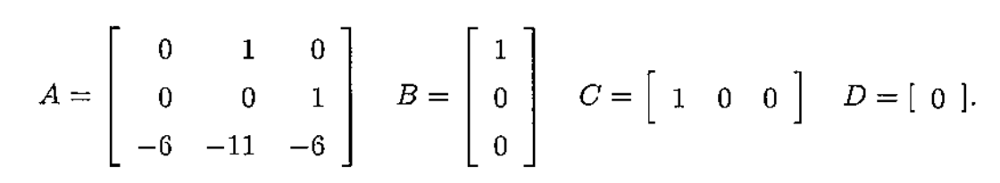
であるとき,$(sI - A) ^ {-1} $, 1 ×　1伝達行列を求め,その極が$-1, -2, -3$であることを確かめよ.
### 解答

一生懸命逆行列を計算を行なった結果

$(sI - A)^{-1} = $\begin{bmatrix}s^{3} + 6s^{2} + 11s + 6 &s + 6&1\\-6&s^{2}+ 6s&s\\-6s&-11s-6&s^{2}\end{bmatrix}

この行列を用いて
$(C(sI - A)^{-1}B + D)U(s)$
を計算すると

$Y(s) = (s^{3} + 6s^{2} + 11s + 6)U(s)$

この式より極を求めると s= -1, -2, -3

## 2.5.22
$R = 3, wL = 5 wC = 1$であるとき,基本$RLC$ループを回る電流を求めよ.電圧と電流を（正弦波）グラフに描け.それらの間の位相差は何か?　本節の冒頭の図2.20の回路で,$R_{1} = C = L = R_{4} = 1$のとき,平衡系(6)を作り,$W$を消去せよ.
### 解答

## 2.5.23
$Ax = b$が,$A = A_{1} + iA_{2}$と$b = b_{1} + ib_{2}$と解$x = x_{1} + i x _{2}$という複素数の行列とベクトルからなるとする.$Ax = b$の実部と虚部を取ることによって,2n個の実未知数$x_{1}$と$x_{2}$に関する$2n$個の実方程式を求めよ.
### 解答